In [1]:
#Importing Necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import scipy.stats as stats

#Loading the files
traindata = pd.read_csv('train_FD001.txt',sep=' ',header = None)
testdata = pd.read_csv('test_FD001.txt',sep=' ',header = None)
RULdata = pd.read_csv('RUL_FD001.txt',sep=' ',header = None)

# Making a readable dataset
columns = {0:'engineNumber',1:'cycleNumber',2:'opSetting1',3:'opSetting2',4:'opSetting3',5:'sensor1',6:'sensor2',
           7:'sensor3',8:'sensor4',9:'sensor5',10:'sensor6',11:'sensor7',12:'sensor8',13:'sensor9',14:'sensor10',
           15:'sensor11',16:'sensor12',17:'sensor13',18:'sensor14',19:'sensor15',20:'sensor16',
           21:'sensor17',22:'sensor18',23:'sensor19',24:'sensor20',25:'sensor21'}

train_data = traindata.rename(columns=columns)
test_data = testdata.rename(columns=columns)
true_rul = RULdata.rename(columns={0: 'RUL'})

In [2]:
train_data.reset_index(level=0,inplace = True)
train_data

,index,engineNumber,cycleNumber,opSetting1,opSetting2,opSetting3,sensor1,sensor2,sensor3,sensor4,...,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21,26,27
0,0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,...,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,NaN,NaN
1,1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,NaN,NaN
2,2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,NaN,NaN
3,3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,NaN,NaN
4,4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,...,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,NaN,NaN
20627,20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,...,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,NaN,NaN
20628,20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,...,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,NaN,NaN
20629,20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,...,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,NaN,NaN


In [3]:
variables_op2 = train_data['opSetting2'].unique()
variables_op2

array([-0.0004, -0.0003,  0.0003,  0.    , -0.0002, -0.0001,  0.0001,
        0.0002,  0.0004,  0.0005,  0.0006, -0.0005, -0.0006])

In [4]:
engine_number = train_data['engineNumber'].unique()
engine_number

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

# Scatter plotter

In [5]:
def plot_scatt(sensor,variable,eng_num):
#     for value in variables_op2:
        data1 =train_data[train_data['opSetting2']==variable]
        data2 = data1[data1['engineNumber']==eng_num]
        plt.figure(figsize=(8,4))
        plt.scatter(x = data2['index'],y=data2[sensor],s=12)
        plt.ylabel(variable,fontsize= 20)
        plt.title("{sens},  Engine Number = {val}".format(sens=sensor, val=eng_num),fontsize = 20)

C:\Users\Rukku\AppData\Local\Temp/ipykernel_21272/457960864.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,4))


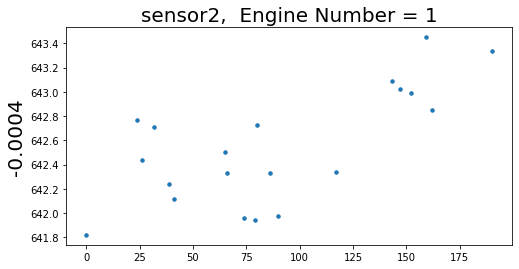

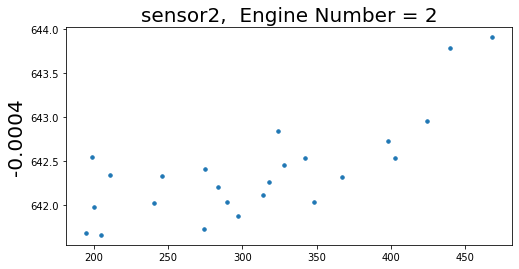

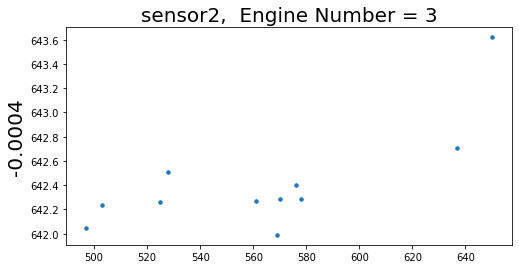

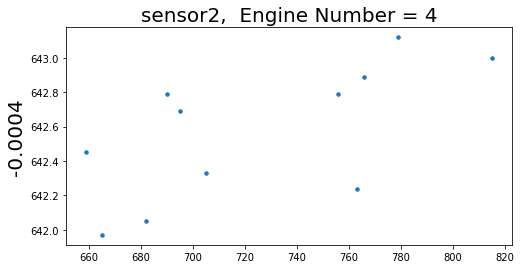

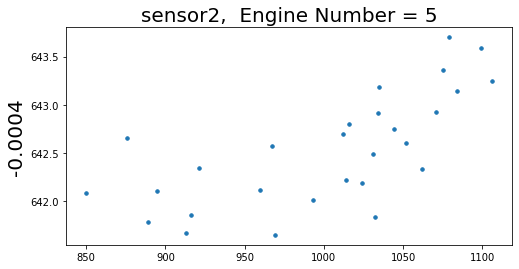

...

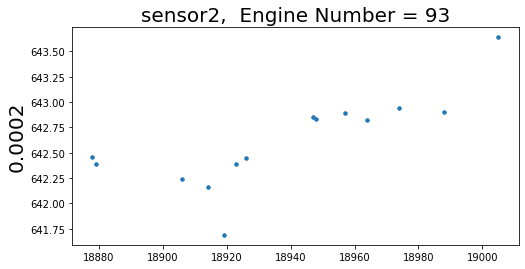

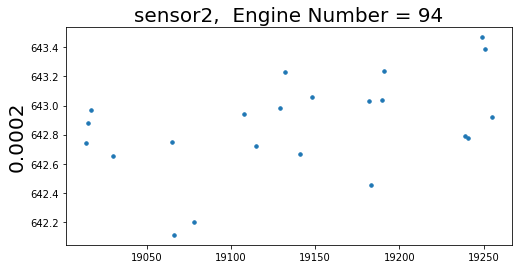

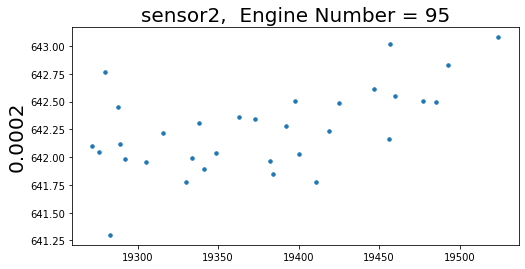

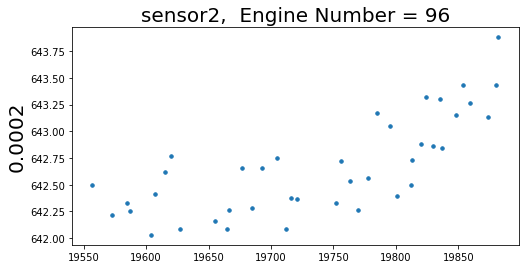

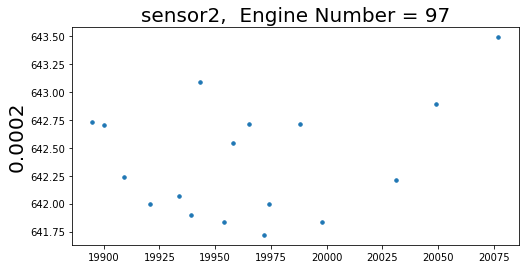

In [ ]:
for i in variables_op2:
    for eng in engine_number:
        plot_scatt('sensor2',i,eng)

In [9]:
def plot_line(sensor,variable,eng_num):
#     for value in variables_op2:
        data1 =train_data[train_data['opSetting2']==variable]
        data2 = data1[data1['engineNumber']==eng_num]
        plt.figure(figsize=(8,4))
        plt.plot(data2[sensor])
        plt.ylabel(variable,fontsize= 20)
        plt.title("{sens}, Engine Number = {val}".format(sens=sensor, val=eng_num),fontsize = 20)

C:\Users\Rukku\AppData\Local\Temp/ipykernel_7900/3880091757.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,4))


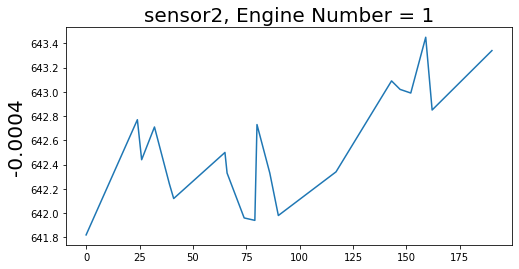

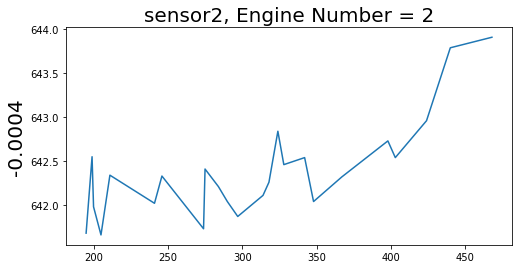

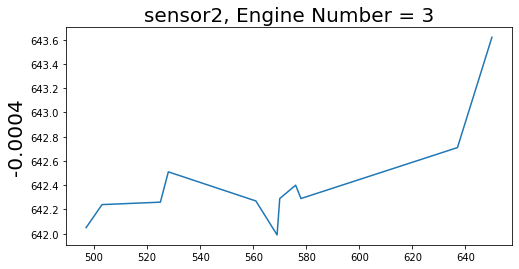

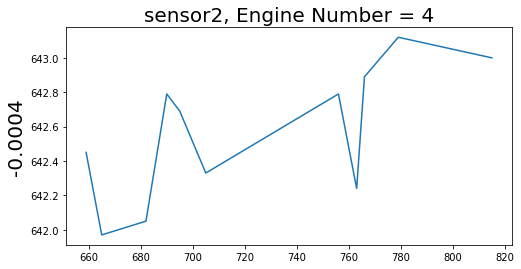

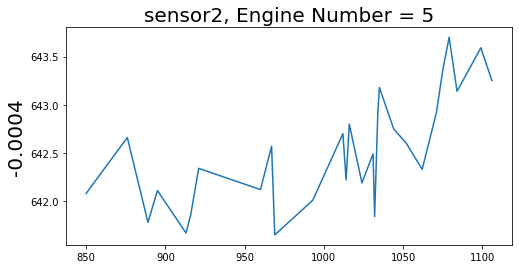

...

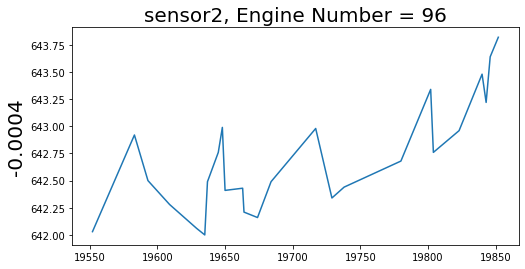

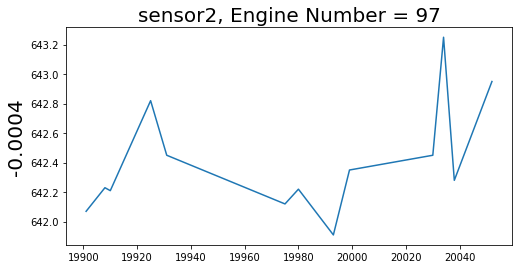

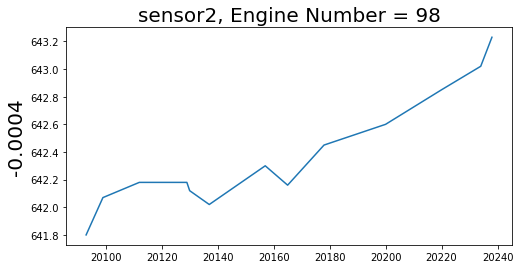

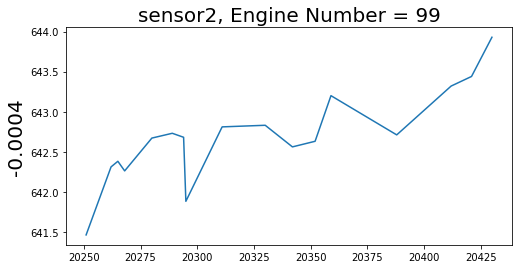

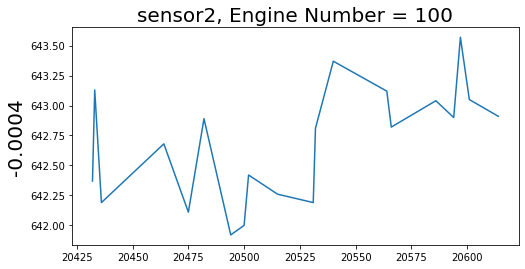

In [10]:
for eng in engine_number:
    plot_line('sensor2',variables_op2[0],eng)